# **Kasırga Sonrası Zarar Görmüş Yapıların VGG-16 ile Sınıflandırılması**

<br>

<img  src="https://raw.githubusercontent.com/geoaihub/geoaihub/main/assets/Mersin%20GeoAI%20Hub%202.png"  height=400  width=1000  alt="https://github.com/geoaihub"/>  

<small>Kaynak: <a  href="https://github.com/geoaihub">GeoAIHub Mersin GitHub</a></small>

<br>

Hurricane Harvey, Ağustos 2017'de Amerika Birleşik Devletleri'nin güneydoğusunu vuran büyük ve yıkıcı bir tropikal siklondu. Texas ve Louisiana eyaletlerinde büyük hasara yol açtı. Bu kasırga, maksimum şiddetiyle dört kategoriye ulaştı ve olağanüstü yağışlar ve güçlü rüzgarlarla büyük tahribat yarattı. Bu kasırga, 2005'teki Wilma Kasırgası'ndan sonra ABD'ye kara ulaşan ilk büyük kasırga olarak tarihsel bir öneme sahiptir. Kasırga yalnızca gücüyle değil, aynı zamanda uzun süreli etkisiyle de dikkat çekmiştir. 17 Ağustos 2017'de Batı Karayip Denizi'ndeki bir bozulmadan oluşarak hızla tropikal fırtınaya dönüşen Harvey, güçlenerek 25 Ağustos 2017'de Texas, Rockport yakınlarında kara çıkmıştır. Kasırga, özellikle Houston ve çevresindeki bölgelerde büyük sel felaketlerine yol açmış, en belirgin özelliği ise uzun süreli yoğun yağışlar olmuştur.

<br>

Yavaş hareket eden kasırga, büyük yıkımlara, yerinden edilmelere ve çok sayıda su kurtarma operasyonuna sebep olmuştur. Binlerce ev ve işyeri büyük hasar görmüştür. Bu felakete karşı, yerel, eyalet ve federal kurumlarla birlikte gönüllüler ve organizasyonlar da müdahaleye katılmıştır. Bu durum, topluluk dayanıklılığı ve acil durum hazırlığının önemini bir kez daha gözler önüne sermiştir. Harvey, ABD tarihindeki en pahalı doğal felaketlerden biri olarak kaydedilmiş ve iyileştirme çalışmalarında altyapı, evler ve toplulukların yeniden inşası önemli bir yer tutmuştur.

<br>

## **Veri Seti ve Çalışma**


Makale, **Building Damage Annotation on Post-Hurricane Satellite Imagery Based on Convolutional Neural Networks** başlığıyla yayımlanmıştır. Bu çalışmada, kasırga hasarlarını sınıflandırmak için çeşitli CNN mimarisi ve teknikleri kullanılmıştır. Makaleye [buradan](https://arxiv.org/abs/1807.01688) ulaşabilirsiniz.

- Kaggle'dan veri seti bağlantısı: [Hurricane Damage Satellite Images](https://www.kaggle.com/datasets/kmader/satellite-images-of-hurricane-damage/)



<br>

## **Yöntem**

Bu çalışmada izlenen metodoloji şu adımlardan oluşmaktadır: veri toplama, ön işleme, model mimarisi seçimi, eğitim ve değerlendirme. Kullanılan veri seti, elmalar ve domateslerin görsellerini içermektedir.

<br>

## **Hedefler**

- Veri setini anlamak.
- Sınıflandırma modeli kurarak sınıfları tahmin etmek.
- Modeli değerlendirmek.
- Class Activation Maps (CAMs) ile modelin açıklanabilirliği.

## **0. İlk Adımlar**

### **0.1. GPU Çalışma Zamanını Seçin**

Çalışma zamanınızın **GPU** olduğundan emin olun (_CPU_ veya _TPU_ değil). Ayrıca, eğer bir seçenekse, _Python 3_ kullandığınızdan emin olun. Bu ayarları yapmak için `Çalışma Zamanı -> Çalışma Zamanı Türünü Değiştir -> Yukarıda belirtilen ayarları seç`.


### **0.2. Veri Setini Aç**

In [ ]:
!unzip -q archive.zip

### **0.3. Kütüphaneleri İçe Aktar**

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import TensorBoard, CSVLogger
from tensorflow.keras.applications import vgg16

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.models import Model, load_model
from keras.preprocessing import image
from keras.utils import load_img, img_to_array

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import KFold

In [ ]:
import cv2

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.ndimage as sp

In [ ]:
import os
import shutil

In [ ]:
import datetime

## **1. Veri Ön İşleme**

### **1.1. Hiperparametreleri Tanımlanması**

In [ ]:
#@markdown ### **Sınıf sayısını girin**
num_classes = 1 #@param {type:"integer"}

#@markdown <br>

#@markdown ### **Görüntü boyutunu girin**
image_resize = 224 #@param {type:"integer"}
# input_shape = (image_resize, image_resize, 3)
IMAGE_SIZE = (image_resize, image_resize)

#@markdown <br>

#@markdown ### **Epoch sayısını girin**
num_epochs = 8 #@param {type:"integer"}

#@markdown <br>

#@markdown ### **Batch boyutlarını girin**
batch_size_training = 32 #@param {type:"integer"}
batch_size_valid = 16 #@param {type:"integer"}
batch_size_test = 8 #@param {type:"integer"}

#@markdown <br>

#@markdown ### **Dizini yollarını girin**
train_path = '/content/train_another' #@param {type:"string"}
valid_path = '/content/validation_another' #@param {type:"string"}
test_path = '/content/test' #@param {type:"string"}
test_path_another = '/content/test_another'


**ImageDataGenerator**, Keras kütüphanesinde yer alan ve görüntü verileri üzerinde veri artırma (data augmentation) ve ön işleme (preprocessing) işlemleri yapmaya yarayan bir sınıftır. Veri artırma, eğitim verisinde çeşitlilik yaratmak için görüntüler üzerinde rastgele dönüşümler (dönme, kaydırma, kırpma, vs.) uygulayarak modelin daha genelleştirilmiş ve dayanıklı hale gelmesini sağlar.

**Faydaları:**
1. **Veri Artırma (Data Augmentation):** Veri setiniz küçükse, `ImageDataGenerator` ile görüntüler üzerinde rastgele dönüşümler uygulayarak eğitim verisini çeşitlendirebilir ve modelin aşırı uyum (overfitting) yapmasının önüne geçebilirsiniz. Örneğin, resimleri döndürme, yatay veya dikey çevirme, yakınlaştırma, kaydırma gibi işlemlerle eğitim setini büyütebilirsiniz.
   
2. **Ön İşleme:** Modeli eğitmeden önce, görüntüleri normalleştirme (örneğin, piksel değerlerini 0-1 aralığına getirme), yeniden boyutlandırma veya başka ön işleme adımlarını otomatik olarak gerçekleştirebilir.

3. **Eğitim Verisini Yükleme:** Büyük veri setlerini bellekten yüklemek zor olabilir. `ImageDataGenerator`,


In [ ]:
train_generator = ImageDataGenerator(rescale = 1./255)

In [ ]:
valid_generator = ImageDataGenerator(rescale=1./255)

In [ ]:
test_generator = ImageDataGenerator(rescale=1./255)

### **1.2. Eğitim Verisinin Düzenlenmesi**

In [ ]:
train_generator = train_generator.flow_from_directory(
    train_path,
    target_size=(image_resize, image_resize),
    batch_size=batch_size_training,
    class_mode='sparse',
    shuffle=True
)

Found 10000 images belonging to 2 classes.


In [ ]:
print('Sınıf indeksleri:', train_generator.class_indices)
print('Eğitim örneklerinin sayısı:', train_generator.samples)
print('İlk ve son 5 dosya adı:', train_generator.filenames[0:5], train_generator.filenames[-5:])

Sınıf indeksleri: {'damage': 0, 'no_damage': 1}
Eğitim örneklerinin sayısı: 10000
İlk ve son 5 dosya adı: ['damage/-93.55964_30.895018.jpeg', 'damage/-93.573763_30.693981.jpeg', 'damage/-93.578271_30.779923999999998.jpeg', 'damage/-93.59011_30.695412.jpeg', 'damage/-93.59030899999999_30.694764000000003.jpeg'] ['no_damage/-97.001414_28.868231.jpeg', 'no_damage/-97.001436_28.876759999999997.jpeg', 'no_damage/-97.00144_28.622428999999997.jpeg', 'no_damage/-97.001677_28.864984000000003.jpeg', 'no_damage/-97.001979_28.623572999999997.jpeg']


In [ ]:
first_batch = next(train_generator)
first_batch

(array([[[[0.27058825, 0.31764707, 0.22352943],
          [0.27058825, 0.31764707, 0.22352943],
          [0.23529413, 0.28235295, 0.18823531],
          ...,
          [0.1764706 , 0.24313727, 0.16862746],
          [0.18431373, 0.2509804 , 0.1764706 ],
          [0.18431373, 0.2509804 , 0.1764706 ]],
 
         [[0.27058825, 0.31764707, 0.22352943],
          [0.27058825, 0.31764707, 0.22352943],
          [0.23529413, 0.28235295, 0.18823531],
          ...,
          [0.1764706 , 0.24313727, 0.16862746],
          [0.18431373, 0.2509804 , 0.1764706 ],
          [0.18431373, 0.2509804 , 0.1764706 ]],
 
         [[0.27450982, 0.32156864, 0.227451  ],
          [0.27450982, 0.32156864, 0.227451  ],
          [0.25882354, 0.30588236, 0.21176472],
          ...,
          [0.1764706 , 0.24313727, 0.16862746],
          [0.18431373, 0.2509804 , 0.1764706 ],
          [0.18431373, 0.2509804 , 0.1764706 ]],
 
         ...,
 
         [[0.33333334, 0.3529412 , 0.2627451 ],
          [0.33333

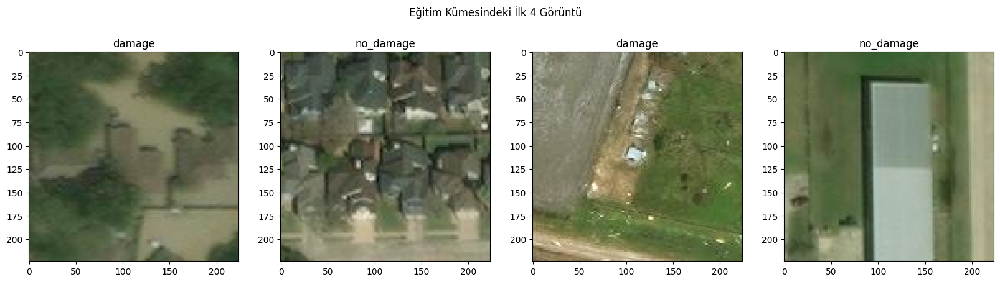

In [ ]:
fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

ind = 0
for ax1 in axs:
    image_data = first_batch[0][ind]
    class_idx = int(first_batch[1][ind])
    class_label = [k for k, v in train_generator.class_indices.items() if v == class_idx][0]
    ax1.imshow(image_data)
    ax1.set_title(class_label)
    ind += 1

fig.suptitle('Eğitim Kümesindeki İlk 4 Görüntü')
plt.show()

### **1.3. Doğrulama Verisinin Düzenlenmesi**

In [ ]:
valid_generator = valid_generator.flow_from_directory(
    valid_path,
    target_size=(image_resize, image_resize),
    batch_size=batch_size_training,
    class_mode='sparse',
    shuffle=True
)

Found 2000 images belonging to 2 classes.


In [ ]:
print('Sınıf indeksleri:', valid_generator.class_indices)
print('Doğrulama örneklerinin sayısı:', valid_generator.samples)
print('İlk ve son 5 dosya adı:', valid_generator.filenames[0:5], valid_generator.filenames[-5:])

Sınıf indeksleri: {'damage': 0, 'no_damage': 1}
Doğrulama örneklerinin sayısı: 2000
İlk ve son 5 dosya adı: ['damage/-93.558326_30.895248.jpeg', 'damage/-93.563851_30.894492.jpeg', 'damage/-93.57315600000001_30.994087.jpeg', 'damage/-93.59649399999999_30.674293.jpeg', 'damage/-93.604811_30.793684999999996.jpeg'] ['no_damage/-97.000188_28.879426000000002.jpeg', 'no_damage/-97.000443_28.859588000000002.jpeg', 'no_damage/-97.000872_28.789737.jpeg', 'no_damage/-97.000945_28.846922999999997.jpeg', 'no_damage/-97.001414_28.622662.jpeg']


In [ ]:
first_batch = next(valid_generator)
first_batch

(array([[[[0.24705884, 0.29803923, 0.227451  ],
          [0.24705884, 0.29803923, 0.227451  ],
          [0.26666668, 0.31764707, 0.24705884],
          ...,
          [0.25490198, 0.30588236, 0.20392159],
          [0.2627451 , 0.3137255 , 0.21176472],
          [0.2627451 , 0.3137255 , 0.21176472]],
 
         [[0.24705884, 0.29803923, 0.227451  ],
          [0.24705884, 0.29803923, 0.227451  ],
          [0.26666668, 0.31764707, 0.24705884],
          ...,
          [0.25490198, 0.30588236, 0.20392159],
          [0.2627451 , 0.3137255 , 0.21176472],
          [0.2627451 , 0.3137255 , 0.21176472]],
 
         [[0.2509804 , 0.3019608 , 0.23137257],
          [0.2509804 , 0.3019608 , 0.23137257],
          [0.2627451 , 0.3137255 , 0.24313727],
          ...,
          [0.25490198, 0.30588236, 0.20392159],
          [0.25490198, 0.30588236, 0.20392159],
          [0.25490198, 0.30588236, 0.20392159]],
 
         ...,
 
         [[0.25490198, 0.29803923, 0.23137257],
          [0.25490

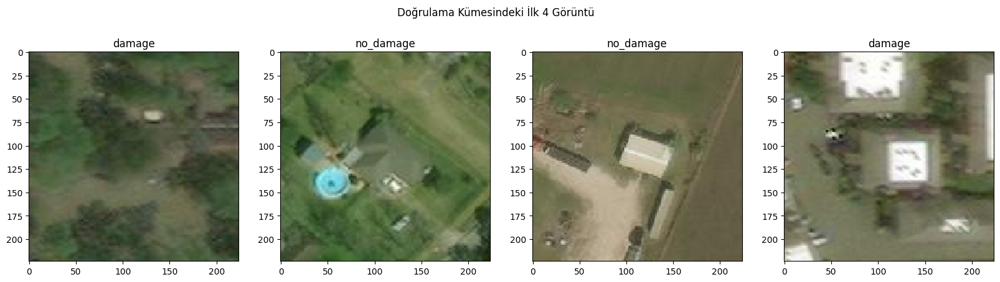

In [ ]:
fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

ind = 0
for ax1 in axs:
    image_data = first_batch[0][ind]
    class_idx = int(first_batch[1][ind])
    class_label = [k for k, v in valid_generator.class_indices.items() if v == class_idx][0]
    ax1.imshow(image_data)
    ax1.set_title(class_label)
    ind += 1

fig.suptitle('Doğrulama Kümesindeki İlk 4 Görüntü')
plt.show()

## **2. Model Eğitimi**

### **2.1. VGG-16 Mimarisi ile Eğitim**

VGG-16, derin öğrenme alanında önemli bir başka mimari olup, özellikle 2014 yılında ILSVRC (ImageNet Large Scale Visual Recognition Challenge) yarışmasında büyük bir başarı kazandı. Görüntü sınıflandırma gibi görevlerde etkili olan bu model, 16 katmanlı derin ağ yapısına sahip olup, adını da bu katman sayısından alır. VGG-16, temel olarak 13 konvolüsyonel katman ve 3 tam bağlantılı katmandan oluşur. Modelin giriş görüntüleri genellikle 224x224 boyutlarında ve 3 renk kanalına (RGB) sahiptir.

<br>

VGG-16'nın en belirgin özelliği, konvolüsyonel katmanlarda çok küçük filtre boyutları kullanmasıdır. Genellikle, 3x3 boyutlarında filtreler tercih edilir, bu da modelin daha küçük ve daha ince özellikleri öğrenmesini sağlar. Konvolüsyonel katmanlar arasına ReLU (Rectified Linear Unit) aktivasyon fonksiyonu eklenerek negatif değerler sıfırlanır ve öğrenme süreci hızlandırılır. VGG-16 mimarisinde ayrıca max-pooling katmanları da bulunur. Bu katmanlar, her konvolüsyonel katmandan sonra yer alarak, görüntülerin boyutlarını küçültür ve modelin önemli özellikleri daha etkili şekilde öğrenmesini sağlar. Son olarak, modelin çıktıyı sınıflandırabilmesi için 3 tam bağlantılı katman ve softmax aktivasyon fonksiyonu kullanılır.

In [ ]:
# model = load_model('/content/model.keras')

#### **2.1.1. Model Oluşturma**

**VGG-16**

<br>

<img src="https://media.geeksforgeeks.org/wp-content/uploads/20200219152207/new41.jpg" height=300 width=1400 alt="AlexNet">

<br>

Bu bölümde modelimizi oluşturmaya başlayacağız. Sıralı ve fonksiyonel olarak 2 farklı şekilde modelimizin mimarisini oluşturabiliriz. Biz, TensorFlow'un **Fonksiyonel** model sınıfını kullanacağız. Sırali inşası ile ilgili detaylı bilgilere [buradan](https://keras.io/guides/sequential_model/) ulaşabilirsiniz.

In [ ]:
#@markdown ### **Öğrenme oranını belirtiniz**

LR = 0.001 #@param {type:"number"}

In [ ]:
def model():

  base_model = vgg16.VGG16(input_shape=IMAGE_SIZE + (3,),
                      weights='imagenet',
                      include_top=False)

  output = layers.GlobalAveragePooling2D()(base_model.output)

  output = layers.Dense(2, activation='softmax')(output)

  model = Model(base_model.input, output)

  for layer in base_model.layers[:-4]:
      layer.trainable=False

  optimizer = tf.keras.optimizers.RMSprop(LR)

  model.compile(loss='sparse_categorical_crossentropy',
                  optimizer=optimizer,
                  metrics=[
                      "accuracy",
                  ])

  model.summary()

  return model

In [ ]:
model = model()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 2)                   │           1,0

 Total params: 14,715,714 (56.14 MB)

 Trainable params: 7,080,450 (27.01 MB)

 Non-trainable params: 7,635,264 (29.13 MB)

In [ ]:
# from tensorflow.keras.utils import plot_model

# plot_model(model, "model.png", show_shapes=True)

In [ ]:
get_ipython().system('rm -rf logs')

logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = TensorBoard(logdir)

csv_file = '/content/training.csv'

In [ ]:
callbacks_list = [tensorboard_callback, CSVLogger(csv_file)]

#### **2.1.2. Model Eğitimi**

In [ ]:
fit_history = model.fit(
    train_generator,
    epochs=num_epochs,
    validation_data=valid_generator,
    callbacks=[callbacks_list],
    verbose=1,
)

Epoch 1/8


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


313/313 ━━━━━━━━━━━━━━━━━━━━ 95s 241ms/step - accuracy: 0.7842 - loss: 2.2655 - val_accuracy: 0.9285 - val_loss: 0.1731
Epoch 2/8
313/313 ━━━━━━━━━━━━━━━━━━━━ 110s 197ms/step - accuracy: 0.9273 - loss: 0.1705 - val_accuracy: 0.9225 - val_loss: 0.1947
Epoch 3/8
313/313 ━━━━━━━━━━━━━━━━━━━━ 62s 196ms/step - accuracy: 0.9405 - loss: 0.1371 - val_accuracy: 0.9520 - val_loss: 0.1128
Epoch 4/8
313/313 ━━━━━━━━━━━━━━━━━━━━ 62s 197ms/step - accuracy: 0.9559 - loss: 0.1063 - val_accuracy: 0.9475 - val_loss: 0.1532
Epoch 5/8
313/313 ━━━━━━━━━━━━━━━━━━━━ 82s 198ms/step - accuracy: 0.9613 - loss: 0.1006 - val_accuracy: 0.9585 - val_loss: 0.1062
Epoch 6/8
313/313 ━━━━━━━━━━━━━━━━━━━━ 83s 202ms/step - accuracy: 0.9674 - loss: 0.0789 - val_accuracy: 0.9450 - val_loss: 0.1706
Epoch 7/8
313/313 ━━━━━━━━━━━━━━━━━━━━ 82s 203ms/step - accuracy: 0.9718 - loss: 0.0742 - val_accuracy: 0.9595 - val_loss: 0.1635
Epoch 8/8
313/313 ━━━━━━━━━━━━━━━━━━━━ 62s 196ms/step - accuracy: 0.9818 - loss: 0.0562 - val_accur

#### **2.1.3. Modelin Performansını Değerlendirme**

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/logs

<IPython.core.display.Javascript object>

In [ ]:
results = model.evaluate(valid_generator, batch_size=batch_size_valid)

loss = results[0]
doğruluk = results[1]
kesinlik = results[2] if len(results) > 2 else None
duyarlılık = results[3] if len(results) > 3 else None

print(f"\nKayıp: {round(loss, 4)}")
print(f"Doğruluk: {round(doğruluk, 4)}")
if kesinlik is not None:
    print(f"Kesinlik (Precision): {round(kesinlik, 4)}")
if duyarlılık is not None:
    print(f"Duyarlılık (Recall): {round(duyarlılık, 4)}")

63/63 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - accuracy: 0.9609 - loss: 0.0897

Kayıp: 0.099
Doğruluk: 0.9615


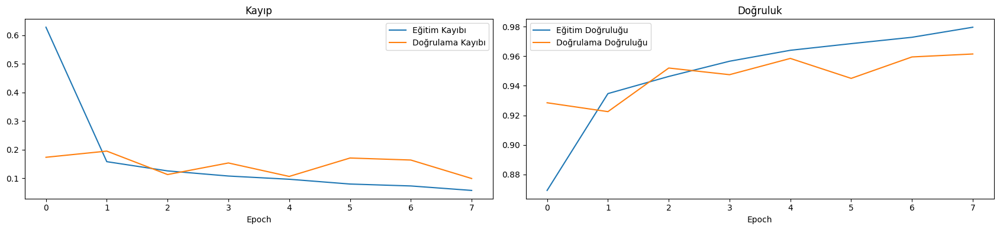

In [ ]:
history = fit_history.history

kayıp = history['loss']
val_kayıp = history['val_loss']
doğruluk = history['accuracy']
val_doğruluk = history['val_accuracy']

plt.figure(figsize=(17, 4))
plt.subplot(1, 2, 1)
plt.plot(kayıp, label='Eğitim Kayıbı')
plt.plot(val_kayıp, label='Doğrulama Kayıbı')
plt.title('Kayıp')
plt.xlabel('Epoch')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(doğruluk, label='Eğitim Doğruluğu')
plt.plot(val_doğruluk, label='Doğrulama Doğruluğu')
plt.title('Doğruluk')
plt.xlabel('Epoch')
plt.legend()

plt.tight_layout()
plt.savefig('/content/kayıp_doğruluk.png')
plt.show()

#### **2.1.3. Test Verisi Üzerinden Performans Değerlendirmesi**

In [ ]:
test_generator = test_generator.flow_from_directory(
    test_path,
    target_size=(image_resize, image_resize),
    batch_size=batch_size_test,
    class_mode='sparse',
    shuffle=True
)

Found 2000 images belonging to 2 classes.


In [ ]:
results = model.evaluate(test_generator, batch_size=batch_size_test)

loss = results[0]
doğruluk = results[1]
kesinlik = results[2] if len(results) > 2 else None
duyarlılık = results[3] if len(results) > 3 else None

print(f"\nKayıp: {round(loss, 4)}")
print(f"Doğruluk: {round(doğruluk, 4)}")
if kesinlik is not None:
    print(f"Kesinlik (Precision): {round(kesinlik, 4)}")
if duyarlılık is not None:
    print(f"Duyarlılık (Recall): {round(duyarlılık, 4)}")

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


250/250 ━━━━━━━━━━━━━━━━━━━━ 18s 51ms/step - accuracy: 0.9701 - loss: 0.0728

Kayıp: 0.0668
Doğruluk: 0.9735


#### **2.1.4. Modeli Kaydet**

Modeli Keras formatında kaydet:

In [ ]:
model.save('model.keras')

## **3. Açıklanabilir Yapay Zeka için Class Activation Maps (CAMs) Oluşturma**

Class Activation Maps (CAMs), bir derin öğrenme modelinin, özellikle de konvolüsyonel sinir ağlarının (CNN), bir görüntü üzerinde hangi bölgelere daha fazla odaklandığını görsel olarak gösteren bir tekniktir. Bu haritalar, modelin karar verirken hangi özellikleri kullandığını anlamamıza yardımcı olur. Örneğin, bir resmin içinde bir nesneyi sınıflandıran bir modelin, nesnenin hangi kısmına daha fazla odaklandığını, bu teknikte renkli bir harita şeklinde görselleştirebiliriz. Bu harita, modelin belirli sınıf için ne kadar güvenli olduğunu ve hangi özelliklere dayanarak tahmin yaptığını anlamamıza olanak tanır. CAM'ler, modelin "şeffaf" olmasına yardımcı olur.

In [ ]:
model = load_model('model.keras')

In [ ]:
outputs = [layer.output for layer in model.layers[1:18]]

vis_model = Model(model.input, outputs)

layer_names = []
for layer in outputs:
    layer_names.append(layer.name.split("/")[0])


print("Görselleştirme için kullanılacak katmanlar: ")
print(layer_names)

Görselleştirme için kullanılacak katmanlar: 
['keras_tensor_1', 'keras_tensor_3', 'keras_tensor_5', 'keras_tensor_7', 'keras_tensor_9', 'keras_tensor_11', 'keras_tensor_13', 'keras_tensor_15', 'keras_tensor_17', 'keras_tensor_19', 'keras_tensor_21', 'keras_tensor_23', 'keras_tensor_25', 'keras_tensor_27', 'keras_tensor_29', 'keras_tensor_31', 'keras_tensor_33']


In [ ]:
#@markdown ### **CAM için gerekli fonksiyonları oluşturulur.**

def get_CAM(processed_image, model, layer_name='block5_conv3'):
    grad_model = tf.keras.models.Model(
        inputs=model.input,
        outputs=[model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(processed_image)
        class_idx = tf.argmax(predictions[0])
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy(), predictions[0]

def show_sample(image_path, model, image_size=(224, 224), layer_name='block5_conv3', dpi=300, class_indices=None):
    img = image.load_img(image_path, target_size=image_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0

    heatmap, class_probabilities = get_CAM(img_array, model, layer_name)

    heatmap_resized = cv2.resize(heatmap, (img_array.shape[2], img_array.shape[1]), interpolation=cv2.INTER_LINEAR)

    heatmap_smoothed = cv2.GaussianBlur(heatmap_resized, (25, 25), sigmaX=15)

    heatmap_smoothed = np.maximum(heatmap_smoothed, 0) / np.max(heatmap_smoothed)

    heatmap_inverted = 1 - heatmap_smoothed

    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_inverted), cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(np.uint8(img_array[0] * 255), 0.6, heatmap_colored, 0.4, 0)

    class_idx = np.argmax(class_probabilities)
    class_prob = class_probabilities[class_idx]
    predicted_class = list(class_indices.keys())[list(class_indices.values()).index(class_idx)]

    plt.figure(figsize=(18, 6), dpi=dpi)

    plt.subplot(1, 3, 1)
    plt.imshow(img_array[0])
    plt.title("Orijinal Görüntü")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(overlay / 255.0)
    plt.title(f"Üst Üste Bindirilmiş Görüntü")
    plt.axis('off')
    plt.text(0.5, -0.1, f"{predicted_class}: {class_prob * 100:.2f}%", ha='center', va='top', transform=plt.gca().transAxes)

    plt.subplot(1, 3, 3)
    plt.imshow(heatmap_colored)
    plt.title("Class Activation Map")
    plt.axis('off')

    plt.tight_layout()
    plt.subplots_adjust(bottom=0.15)
    plt.savefig("CAM_output.png", dpi=dpi)
    plt.show()

`Zarar Yok` sınıf görselleştirmesi:

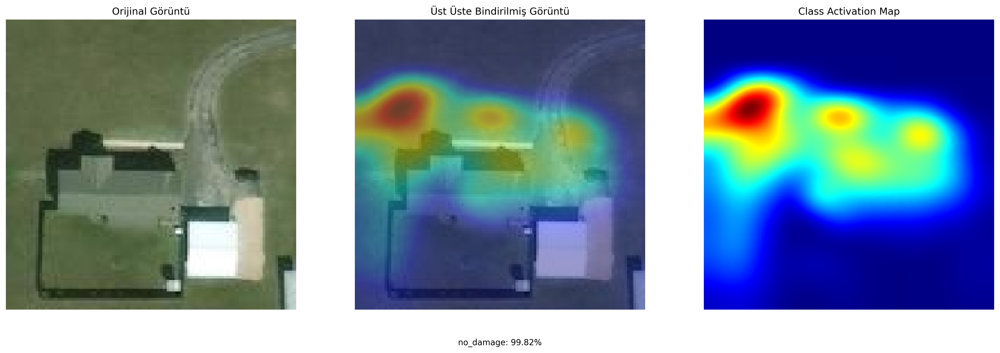

In [ ]:
image_path = '/content/test_another/no_damage/-95.062321_30.060401000000002.jpeg'

show_sample(
    image_path=image_path,
    model=model,
    class_indices=train_generator.class_indices
)

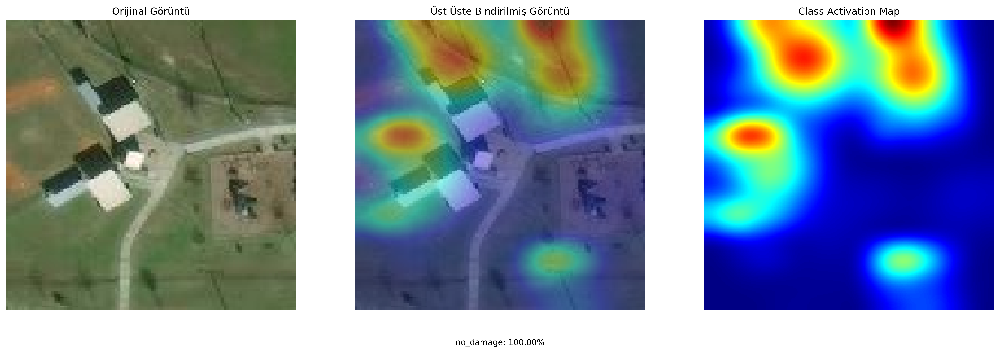

In [ ]:
image_path = '/content/test_another/no_damage/-95.062533_30.055047.jpeg'

show_sample(
    image_path=image_path,
    model=model,
    class_indices=train_generator.class_indices
)

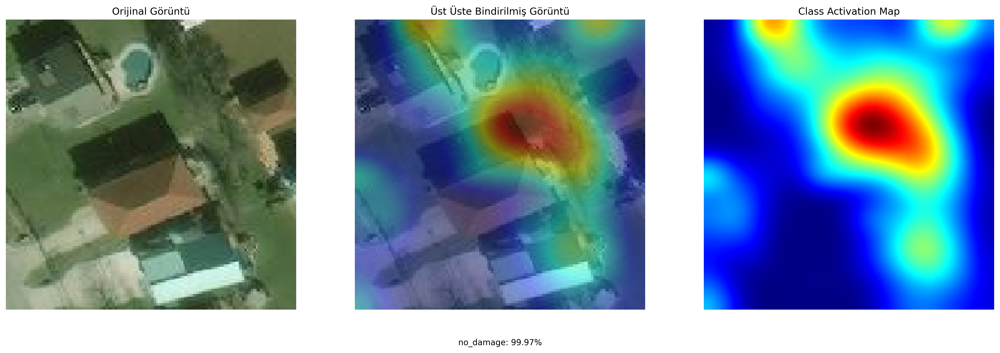

In [ ]:
image_path = '/content/test_another/no_damage/-95.062589_29.830265.jpeg'

show_sample(
    image_path=image_path,
    model=model,
    class_indices=train_generator.class_indices
)

`Zarar` sınıf görselleştirmesi:

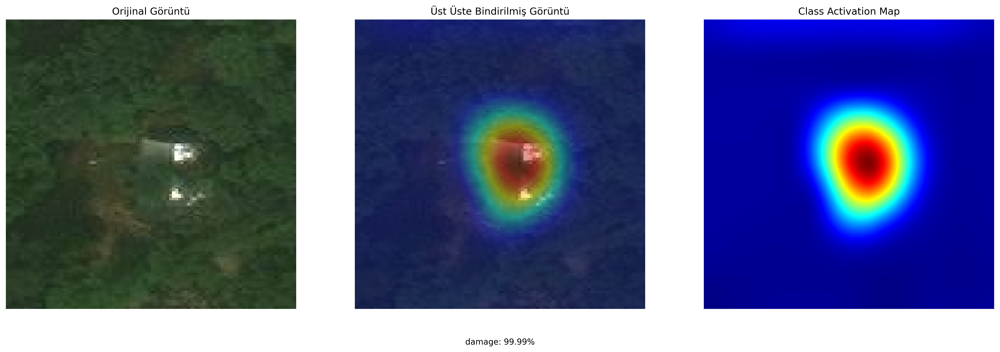

In [ ]:
image_path = '/content/test_another/damage/-93.528502_30.987438.jpeg'

show_sample(
    image_path=image_path,
    model=model,
    class_indices=train_generator.class_indices
)

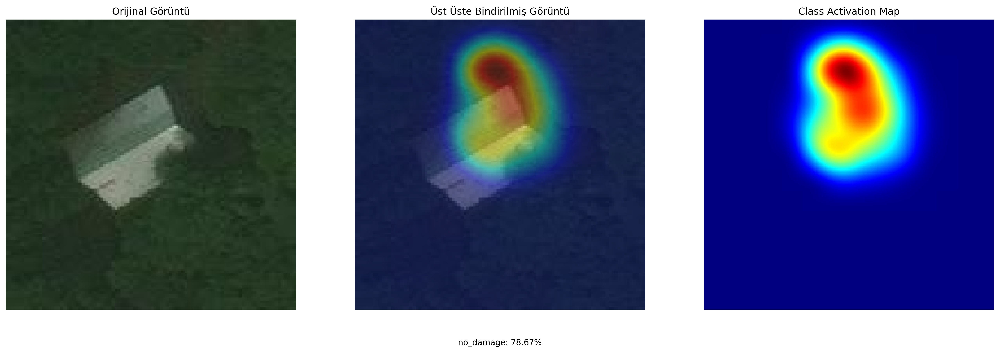

In [ ]:
image_path = '/content/test_another/damage/-93.5302_30.988157.jpeg'

show_sample(
    image_path=image_path,
    model=model,
    class_indices=train_generator.class_indices
)

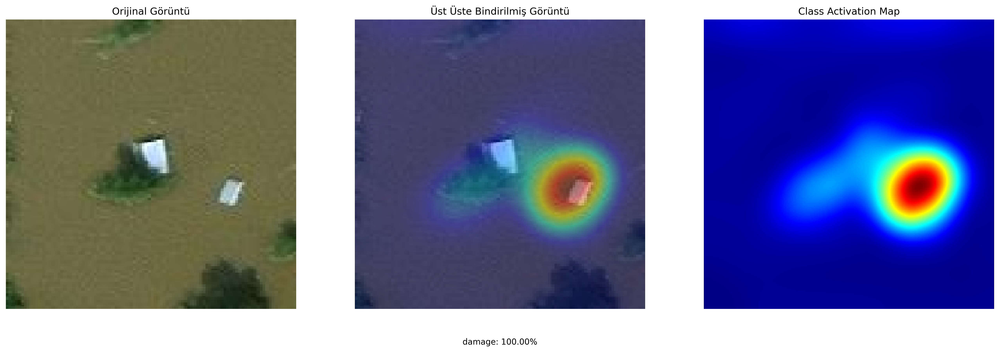

In [ ]:
image_path = '/content/test_another/damage/-93.57781_30.779509.jpeg'

show_sample(
    image_path=image_path,
    model=model,
    class_indices=train_generator.class_indices
)

Intermediate activations (veya ara aktivasyonlar), bir derin öğrenme modelinin (özellikle de konvolüsyonel sinir ağlarının) katmanlarındaki ara çıktılardır. Bir model, bir görseli (örneğin bir fotoğraf) işlerken, her katmanda farklı özellikleri öğrenir. Bu katmanlar, görselin farklı özelliklerini (örneğin kenarlar, renkler, dokular, vs.) çıkarır. Ara aktivasyonlar, bu özelliklerin her bir katmanda nasıl "aktifleştiğini" gösterir.

In [ ]:
#@markdown ### **Ara aktivasyonları görselleştirebilmek için gerekli fonksiyonları oluşturulur.**

def visualize_intermediate_activations(model, image, layer_names, images_per_row=16):
    assert len(layer_names) > 0, "Layer names list should not be empty"

    layer_outputs = [layer.output for layer in model.layers if layer.name in layer_names]

    activation_model = tf.keras.models.Model(inputs=model.input, outputs=layer_outputs)

    activations = activation_model.predict(image)

    for layer_name, layer_activation in zip(layer_names, activations):
        nb_features = layer_activation.shape[-1]
        size = layer_activation.shape[1]

        nb_cols = nb_features // images_per_row
        grid = np.zeros((size * nb_cols, size * images_per_row))

        for col in range(nb_cols):
            for row in range(images_per_row):
                feature_map = layer_activation[0, :, :, col * images_per_row + row]

                feature_map -= feature_map.mean()
                feature_map /= feature_map.std()
                feature_map *= 255
                feature_map = np.clip(feature_map, 0, 255).astype(np.uint8)

                grid[col * size:(col + 1) * size, row * size:(row + 1) * size] = feature_map

        scale = 1. / size
        plt.figure(figsize=(scale * grid.shape[1], scale * grid.shape[0]))
        plt.title(f"Activations of {layer_name}")
        plt.grid(False)
        plt.axis('off')
        plt.imshow(grid, aspect='auto', cmap='viridis')

    plt.show()

def extract_activations(model, image):
    layer_outputs = [layer.output for layer in model.layers]
    activation_model = tf.keras.models.Model(inputs=model.input, outputs=layer_outputs)

    activations = activation_model.predict(image)
    layer_names = [layer.name for layer in model.layers]

    return layer_names, activations

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


<ipython-input-47-2411c4956dc6>:31: RuntimeWarning: invalid value encountered in divide
  feature_map /= feature_map.std()
<ipython-input-47-2411c4956dc6>:33: RuntimeWarning: invalid value encountered in cast
  feature_map = np.clip(feature_map, 0, 255).astype(np.uint8)


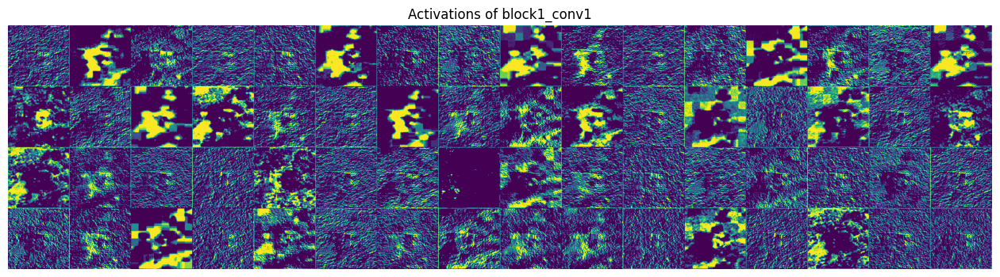

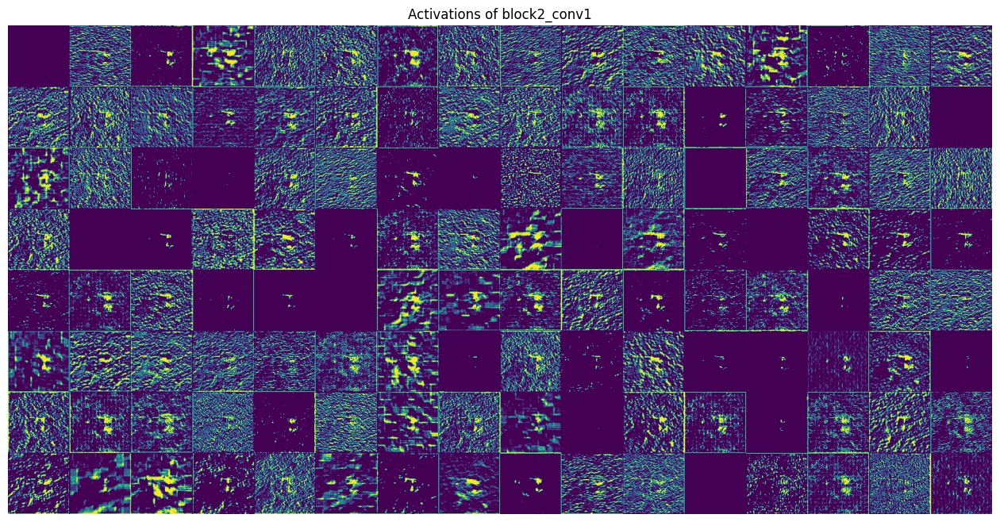

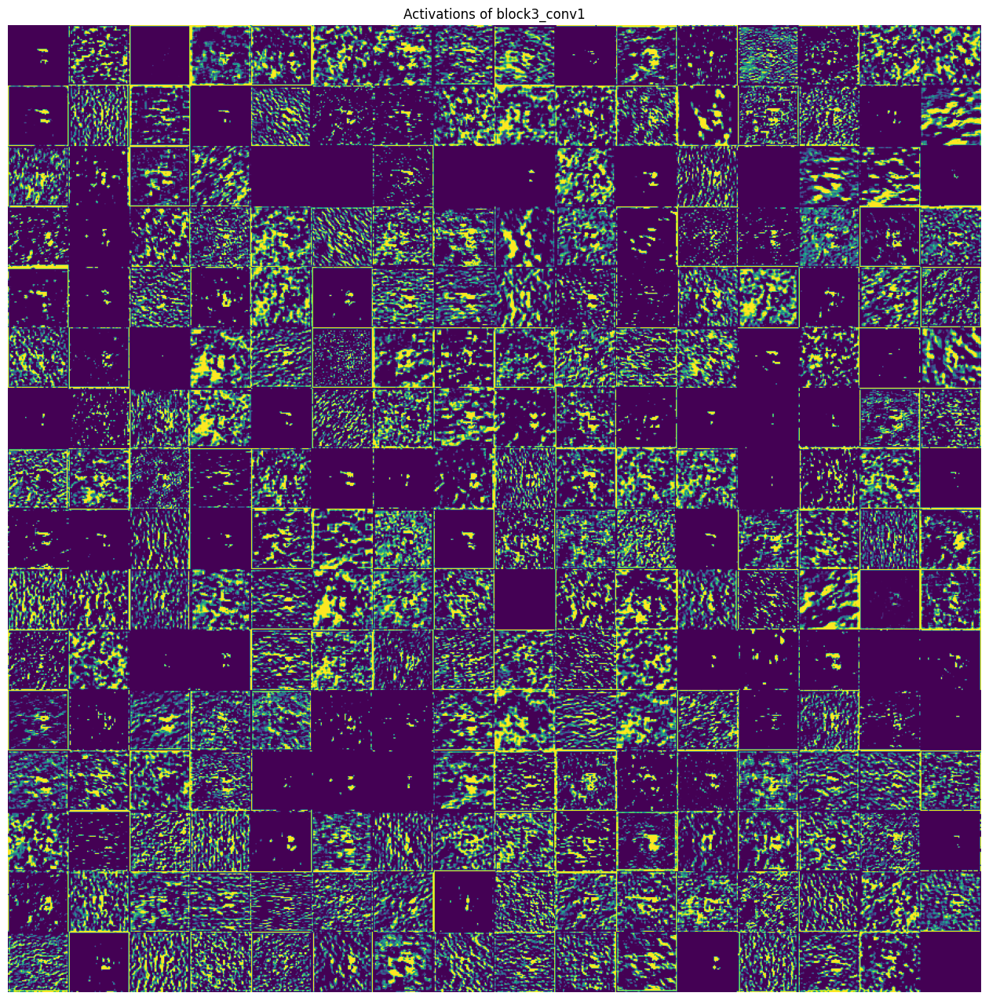

In [ ]:
image_path = '/content/test_another/damage/-93.528502_30.987438.jpeg'

img = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))
img_array = tf.keras.preprocessing.image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array /= 255.0
layer_names, activations = extract_activations(model, img_array)

selected_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1']
visualize_intermediate_activations(model, img_array, selected_layers)

## **4. Verileri Lokal Cihaza İndirme**

In [ ]:
!zip -r /content/logs.zip /content/logs

  adding: content/logs/ (stored 0%)
  adding: content/logs/20241222-183141/ (stored 0%)
  adding: content/logs/20241222-183141/train/ (stored 0%)
  adding: content/logs/20241222-183141/train/events.out.tfevents.1734892303.f169738a7204.20770.0.v2 (deflated 89%)
  adding: content/logs/20241222-183141/validation/ (stored 0%)
  adding: content/logs/20241222-183141/validation/events.out.tfevents.1734892388.f169738a7204.20770.1.v2 (deflated 70%)


In [ ]:
from google.colab import files
files.download("/content/logs.zip")
files.download("/content/model.keras")

Akılınıza takılan bir soru varsa, lütfen bizimle paylaşın. Yardımcı olmaktan memnuniyet duyarız:**

<br>

- **Doğu İlmak** - doguilmak@gmail.com

- **Doç. Dr. Muzaffer Can IBAN** - caniban@mersin.edu.tr